Мы будем предсказывать расположение и класс дефектов, обнаруженных на производстве стальных листов. Изображения имеют уникальные названия ImageId. Целью является сегментировать и классифицировать дефекты по изображениям из test датасета.<br>
Каждое изображение может вообще не иметь дефектов, иметь дефект только одного класса или дефекты нескольких классов. Для каждого изображения нужно сегментировать дефекты каждого класса (ClassId = [1, 2, 3, 4])<br>
Сегмент для дефекта каждого класса должен быть записан в отдельную строку, даже если на изображении присутствуют несколько дискретных расположений дефекта


**Файлы** <br>
- train_images/ - папка изображений для тренировки модели <br>
- test_images/ - папка изображений для тестирования модели (мы сегментируем и классифицируем эти изображения)<br>
- train.csv - аннотации с сегментами дефектов на изображениях из тренировочного датасета (ClassId = [1, 2, 3, 4])<br>
- sample_submission.csv - a sample submission file in the correct format; <br>


*note, each ImageId 4 rows, one for each of the 4 defect classes*

Пиксели номируются сверху вниз, потом слева направо, то есть 1й пиксель это $(0,0)$, 2й пиксель это $(1,0)$.<br>
То есть если на картинке пиксель $(i,j)$, где $i$ - номер строки, $j$ - номер столбца, то его номер $n$ вычисляется по формуле $n = 256* j + i + 1$<br>
Формула для вычисления i, j по порядковому номеру n:<br>
$j = int(n/256)$<br>
$i = n - 256*int(n/256) - 1 = n - 256*j -1$

In [1]:
!pip install opencv-python
!pip install plotly
!pip install -U protobuf==3.11.3

Requirement already up-to-date: protobuf==3.11.3 in /Users/Xenia/opt/anaconda3/lib/python3.7/site-packages (3.11.3)


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O
import matplotlib.pyplot as plt # Import matplotlib for data visualisation
import seaborn as sns
#import pandas_profiling as pp
import os
from collections import defaultdict
import imageio
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import plotly
from plotly import graph_objects as go
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "jupyterlab"

In [ ]:
print(os.listdir("data"))

In [12]:
print(os.listdir("data"))
for dirname, _, filenames in os.walk('data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

['sample_submission.csv', 'test_images', 'train.csv', 'train_images']
data\sample_submission.csv
data\train.csv
data\test_images\0000f269f.jpg
data\test_images\000ccc2ac.jpg
data\test_images\002451917.jpg
data\test_images\003c5da97.jpg
data\test_images\0042e163f.jpg
data\test_images\004f40c73.jpg
data\test_images\00513039a.jpg
data\test_images\006f39c41.jpg
data\test_images\008725cbc.jpg
data\test_images\0098ca44e.jpg
data\test_images\00a0b7730.jpg
data\test_images\00a0f9949.jpg
data\test_images\00b000b81.jpg
data\test_images\00b7fb703.jpg
data\test_images\00bbcd9af.jpg
data\test_images\00d72c660.jpg
data\test_images\00df5b714.jpg
data\test_images\00f3799a7.jpg
data\test_images\0108ce457.jpg
data\test_images\0109b68ec.jpg
data\test_images\010ec96b4.jpg
data\test_images\011a7e2a9.jpg
data\test_images\0126f74ef.jpg
data\test_images\012754bbb.jpg
data\test_images\01588ee42.jpg
data\test_images\015be539e.jpg
data\test_images\017796c88.jpg
data\test_images\017bd7ce3.jpg
data\test_images\018

data\test_images\002451917.jpg
(256, 1600, 3)


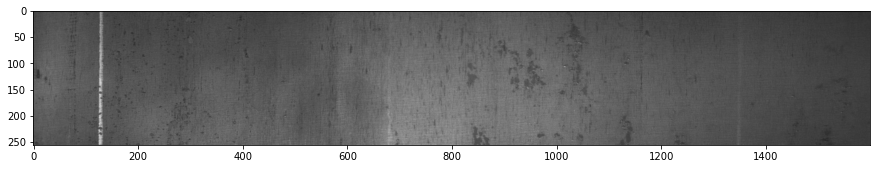

data\test_images\003c5da97.jpg
(256, 1600, 3)


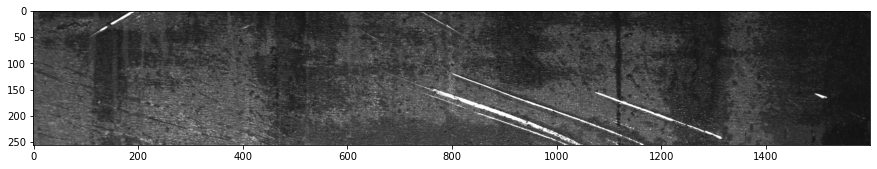

data\test_images\0042e163f.jpg
(256, 1600, 3)


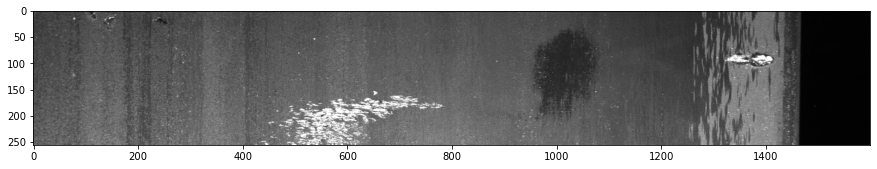

data\test_images\004f40c73.jpg
(256, 1600, 3)


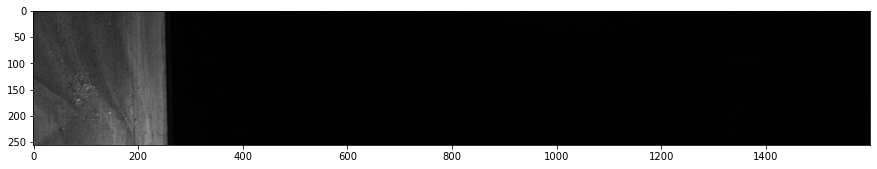

data\test_images\00513039a.jpg
(256, 1600, 3)


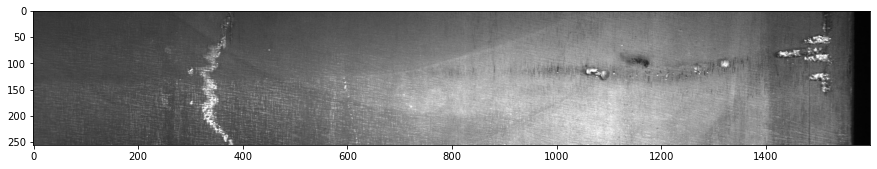

data\test_images\006f39c41.jpg
(256, 1600, 3)


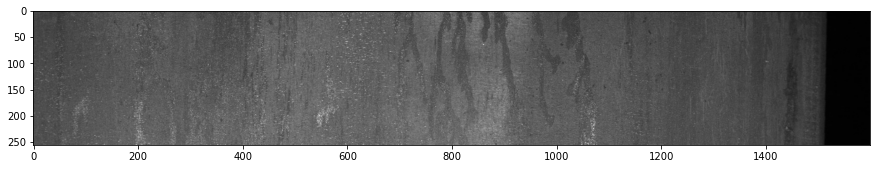

data\test_images\008725cbc.jpg
(256, 1600, 3)


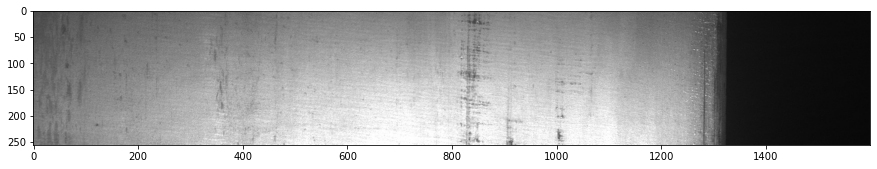

data\test_images\0098ca44e.jpg
(256, 1600, 3)


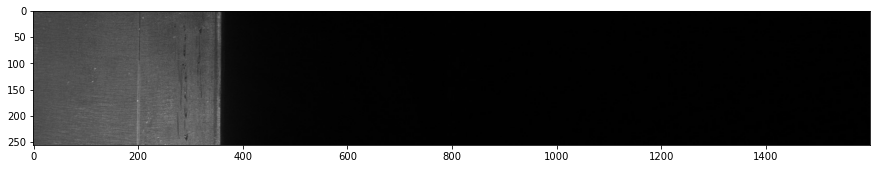

data\train_images\000418bfc.jpg
(256, 1600, 3)


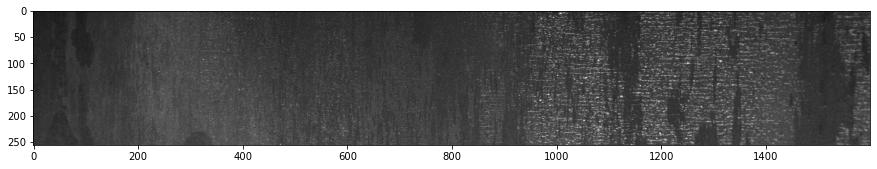

data\train_images\000789191.jpg
(256, 1600, 3)


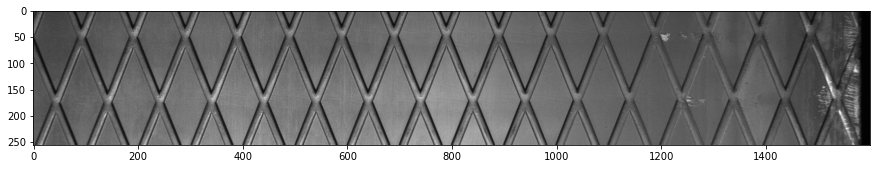

data\train_images\0007a71bf.jpg
(256, 1600, 3)


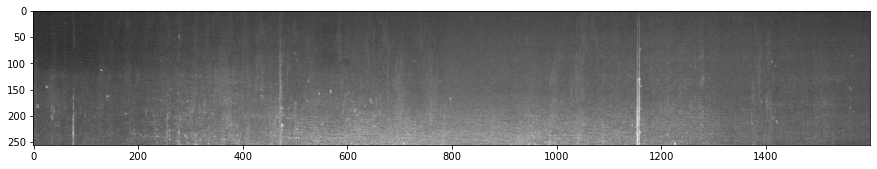

data\train_images\000a4bcdd.jpg
(256, 1600, 3)


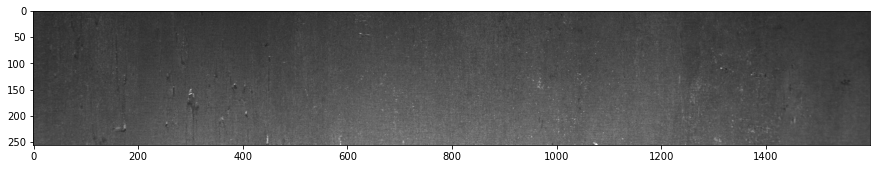

data\train_images\000f6bf48.jpg
(256, 1600, 3)


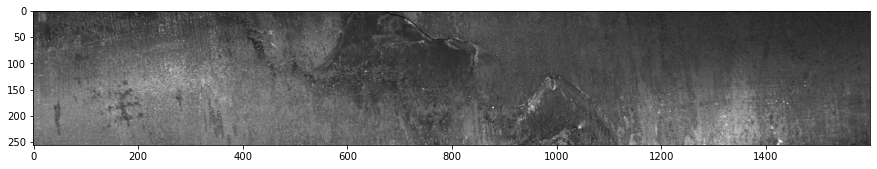

data\train_images\0014fce06.jpg
(256, 1600, 3)


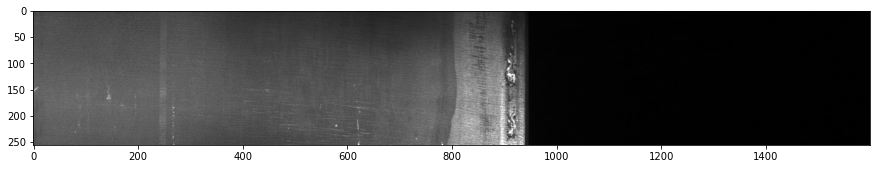

data\train_images\001982b08.jpg
(256, 1600, 3)


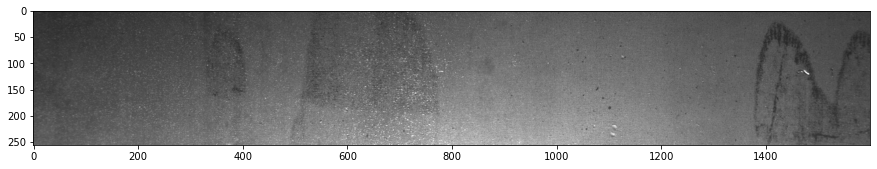

data\train_images\001d1b355.jpg
(256, 1600, 3)


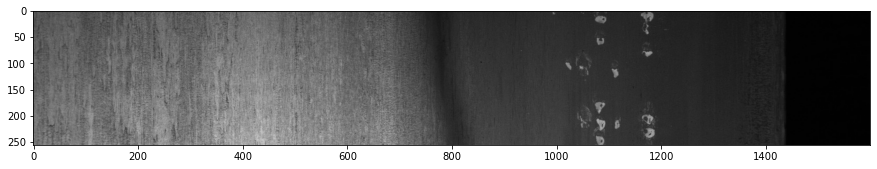

In [13]:
#lets have a look at some images
for dirname, _, filenames in os.walk('data'):
    for filename in filenames[2:10]:
        print(os.path.join(dirname, filename))
        im1 = imageio.imread(os.path.join(dirname, filename)) #Read the image from the desktop
        print(im1.shape) #Returns the number of rows, columns and channels (if image is color returns "3")
        plt.figure(figsize=(15,10))
        plt.imshow(im1)
        plt.show()

In [14]:
data_dir ="data"
input_file0 = "train.csv"
input_file1 = "sample_submission.csv"
abspath='/'.join(os.getcwd().split('\\')) 
source_folder = os.path.join(abspath, 'data')
df_train = pd.read_csv(os.path.join(source_folder,input_file0))
df_sample = pd.read_csv(os.path.join(source_folder,input_file1))

In [15]:
df_train.head()

,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...


In [16]:
df_train.shape

(7095, 3)

In [17]:
# Пути на папки с train_images и test_images соответственно
trainImgPath =os.path.join(source_folder,'train_images/')
testImgPath = os.path.join(source_folder,'test_images/')

In [18]:
# Создадим таблицу с ImageId из папки train_images
# Каждому ImageId будут соответствовать 4 строки (для каждого класса дефекта)
train_Img_Id = []
train_class_Id = []
for i in os.listdir(trainImgPath):
    for j in range(1,5):
        train_Img_Id.append(i)
        train_class_Id.append(j)
train_Imgs = pd.DataFrame(train_Img_Id,columns=['ImageId'])
train_Imgs['ClassId'] = train_class_Id
train_Imgs.head(10)

,ImageId,ClassId
0,0002cc93b.jpg,1
1,0002cc93b.jpg,2
2,0002cc93b.jpg,3
3,0002cc93b.jpg,4
4,00031f466.jpg,1
5,00031f466.jpg,2
6,00031f466.jpg,3
7,00031f466.jpg,4
8,000418bfc.jpg,1
9,000418bfc.jpg,2


In [19]:
# Создадим таблицу - объединение 2х таблиц train_Img, df_train
# Nan значения заменим пустыми строками
train_d = pd.merge(train_Imgs, df_train,how='outer', on=['ImageId','ClassId']) 
train_d = train_d.fillna('') 
train_d.head(10)

,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0002cc93b.jpg,2,
2,0002cc93b.jpg,3,
3,0002cc93b.jpg,4,
4,00031f466.jpg,1,
5,00031f466.jpg,2,
6,00031f466.jpg,3,
7,00031f466.jpg,4,
8,000418bfc.jpg,1,
9,000418bfc.jpg,2,


In [20]:
train_d.shape

(34190, 3)

In [21]:
# Изменим структуру таблицы:
# каждому ImageId отвечает одна строка, а столбцы - это дефекты различных классов, если дефект какого-либо класса отсутствует, 
# то в соответствующем столбце - пустое значение
train_data = pd.pivot_table(train_d, values='EncodedPixels', index='ImageId',columns='ClassId', aggfunc=np.sum).astype(str)
train_data = train_data.reset_index() # add Index column to one level with classID   
train_data.columns = ['ImageId','Defect_1','Defect_2','Defect_3','Defect_4']
train_data.columns
train_data = train_data.replace({'nan':''})

In [22]:
print(train_data.shape)
print(len(np.unique(train_data.ImageId.values)))

(10387, 5)
10387


In [23]:
train_data.head()

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,,,
1,00031f466.jpg,,,,
2,000418bfc.jpg,,,,
3,000789191.jpg,,,,
4,0007a71bf.jpg,,,18661 28 18863 82 19091 110 19347 110 19603 11...,


In [24]:
# Добавим колонки: 
# has_defect - индификатор наличия дефекта какого-либо класса, 
has_defect = []
for index,row in train_data.iterrows():
    if row.Defect_1 or row.Defect_2 or row.Defect_3 or row.Defect_4: 
        has_defect.append(1)
    else:
        has_defect.append(0)
        
train_data["has_defect"] = has_defect 
number_of_defects=[]
for index, row in train_data.iterrows():
    i=0
    if row.Defect_1:
        i=i+1
    if row.Defect_2:
        i=i+1
    if row.Defect_3:
        i=i+1
    if row.Defect_4:
        i=i+1
    number_of_defects.append(i)
        
train_data["number_of_defects"] = number_of_defects  
train_data.head(5)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,,,,1,1
1,00031f466.jpg,,,,,0,0
2,000418bfc.jpg,,,,,0,0
3,000789191.jpg,,,,,0,0
4,0007a71bf.jpg,,,18661 28 18863 82 19091 110 19347 110 19603 11...,,1,1


In [25]:
#Number of images with defects of several classes
train_data["number_of_defects"].value_counts()

1    6239
0    3721
2     425
3       2
Name: number_of_defects, dtype: int64

Text(0.5, 0, 'Number of classes')

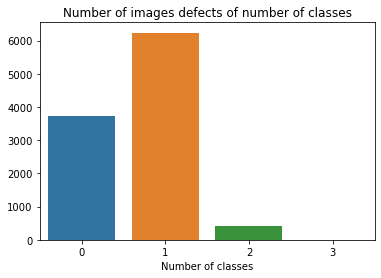

In [26]:
fig, ax = plt.subplots()
sns.barplot(x=list(train_data["number_of_defects"].value_counts().index), y=list(train_data["number_of_defects"].value_counts().values), ax=ax)
ax.set_title("Number of images defects of number of classes")
ax.set_xlabel("Number of classes")

Большинство изображений имеют дефекты одного класса (6239 экземпляров), дефекты двух классов имеют 425 изображений, лишь 2 изображения содеожат дефекты трех классов и нет ни одного изображающего, содержащего дефекты всех четырех классов.

In [27]:
# Number of images for each class
class_count={}
class_count['1'] = train_data[train_data['Defect_1']!=''].shape[0]
class_count['2'] = train_data[train_data['Defect_2']!=''].shape[0]
class_count['3'] = train_data[train_data['Defect_3']!=''].shape[0]
class_count['4'] = train_data[train_data['Defect_4']!=''].shape[0]
print('Class 1 ', class_count['1'])
print('Class 2 ', class_count['2'])
print('Class 3 ', class_count['3'])
print('Class 4 ', class_count['4'])

Class 1  897
Class 2  247
Class 3  5150
Class 4  801


{'1': 897, '2': 247, '3': 5150, '4': 801}

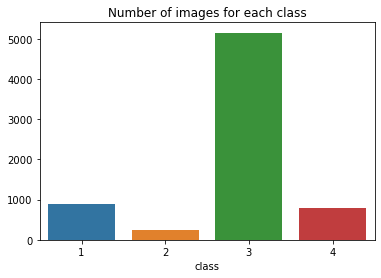

In [28]:
fig, ax = plt.subplots()
sns.barplot(x=list(class_count.keys()), y=list(class_count.values()), ax=ax)
ax.set_title("Number of images for each class")
ax.set_xlabel("class")
class_count

Преобладающим классом дефектов является класс 3, так как его содержат 5150 изображений. На втором месте находится класс 1 с 897 изображениями, на третьем - класс 4 (801 изображение). Меньше всего изображений, содержащих дефекты класса 2 - 247 изображений.

In [29]:
train_data.shape

(10387, 7)

In [30]:
train_data.has_defect.value_counts()

1    6666
0    3721
Name: has_defect, dtype: int64

In [31]:
def mask_to_rle(mask):
    """
    params:  mask - numpy array
    returns: run-length encoding string (pairs of start & length of encoding)
    """
    
    # turn a n-dimensional array into a 1-dimensional series of pixels
    # for example:
    #     [[1. 1. 0.]
    #      [0. 0. 0.]   --> [1. 1. 0. 0. 0. 0. 1. 0. 0.]
    #      [1. 0. 0.]]
    flat = mask.flatten()
    
    # we find consecutive sequences by overlaying the mask
    # on a version of itself that is displaced by 1 pixel
    # for that, we add some padding before slicing
    padded = np.concatenate([[0], flat, [0]])
    
    # this returns the indices where the sliced arrays differ
    runs = np.where(padded[1:] != padded[:-1])[0] 
    # indexes start at 0, pixel numbers start at 1
    runs += 1

    # every uneven element represents the start of a new sequence
    # every even element is where the run comes to a stop
    # subtract the former from the latter to get the length of the run
    runs[1::2] -= runs[0::2]
 
    # convert the array to a string
    return ' '.join(str(x) for x in runs)

In [32]:
a=np.array([[0., 0., 1.],[0., 1., 0.],[0., 0., 1.]])
a

array([[0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [33]:
mask_to_rle(a)

'3 1 5 1 9 1'

In [34]:
def rle_to_mask(lre, shape=(1600, 256)):
    '''
    params:  rle   - run-length encoding string (pairs of start & length of encoding)
             shape - (width,height) of numpy array to return 
    
    returns: numpy array with dimensions of shape parameter
    '''    
    h, w = shape
    if len(lre)>0:# the incoming string is space-delimited
        runs = np.asarray([int(run) for run in lre.split(' ')])

        # we do the same operation with the even and uneven elements, but this time with addition
        runs[1::2] += runs[0::2]
        # pixel numbers start at 1, indexes start at 0
        runs -= 1

        # extract the starting and ending indeces at even and uneven intervals, respectively
        run_starts, run_ends = runs[0::2], runs[1::2]

        # build the mask
        mask = np.zeros(h*w, dtype=np.uint8)
        for start, end in zip(run_starts, run_ends):
            mask[start:end] = 1
    elif len(lre)==0:
        mask = np.zeros(h*w, dtype=np.uint8)
    # transform the numpy array from flat to the original image shape
    return mask.reshape(shape).T

In [35]:
rle_to_mask('3 3 7 2', shape=(3, 3))

array([[0, 1, 1],
       [0, 1, 1],
       [1, 0, 0]], dtype=uint8)

In [36]:
rle_to_mask('', shape=(3, 3))

array([[0, 0, 0],
       [0, 0, 0],
       [0, 0, 0]], dtype=uint8)

In [37]:
def load_img(img_id):
    img_dir='train_images' 
    img = cv2.imread(os.path.join(os.path.join(data_dir,img_dir), img_id))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    return img

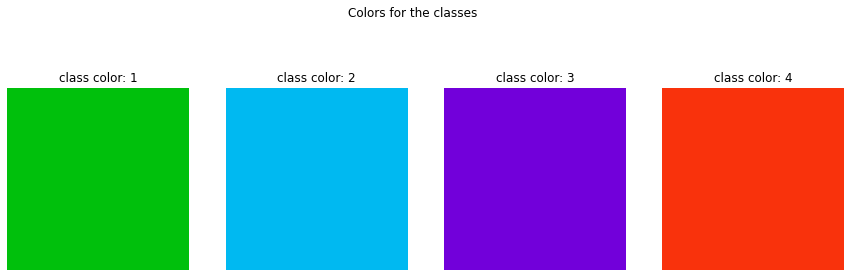

In [38]:
rgb_for_label = {i:v for i, v in enumerate([(0, 192, 12), (0, 185, 241), (114, 0, 218), (249,50,12)], start=1)}

    
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(0, 4):
    ax[i].axis('off')
    ax[i].imshow(np.ones((50, 50, 3), dtype=np.uint8) * rgb_for_label[i+1])
    ax[i].set_title("class color: {}".format(i+1))
fig.suptitle("Colors for the classes")

plt.show()


In [39]:
def show_masked_image(img_id, ax=None, thickness=2):
    if ax is None:
        fig, ax = plt.subplots(figsize=(15, 5))
    
    img = load_img(img_id)
    for i, col in df_train[df_train['ImageId'] == img_id].iterrows():
        encoded_pixels = col['EncodedPixels']
        label = col['ClassId']
        mask = rle_to_mask(encoded_pixels, shape=(1600, 256))
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        img = cv2.drawContours(img, contours, -1, rgb_for_label[label], thickness=thickness)
    ax.imshow(img)
    return ax

#def show_masked_images_per_class(label, num_images=5):

    #num_imgs = 5
    #fig, axs = plt.subplots(nrows=num_imgs, ncols=1, figsize=(15, 15))
    #axs = axs.ravel()
    
    #image_ids = np.asarray(train_data[train_data['Defect_1']!='']['ImageId'].values)
    #random_ids = list(image_ids)[:5]
    
    #for i, img_id in enumerate(image_ids[random_ids]):
        #show_masked_image(img_id, ax=axs[i])
        

<AxesSubplot:>

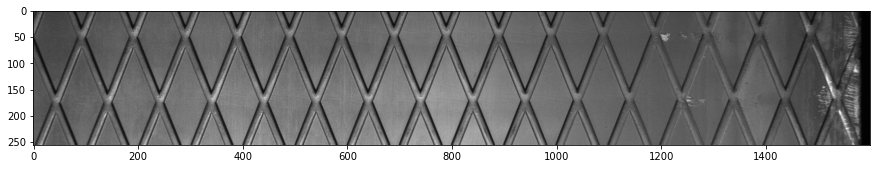

In [40]:
#Без дефектов
show_masked_image('000789191.jpg')

<AxesSubplot:>

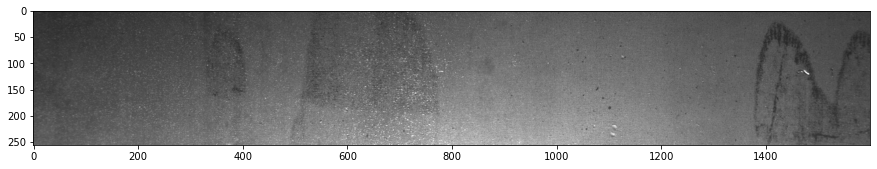

In [41]:
show_masked_image('001982b08.jpg')

## Аналитика изображений с дефектами 

In [42]:
#Первые 10 изображений с дефектами класса 1
train_data[train_data['Defect_1']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
0,0002cc93b.jpg,29102 12 29346 24 29602 24 29858 24 30114 24 3...,,,,1,1
5,000a4bcdd.jpg,37607 3 37858 8 38108 14 38359 20 38610 25 388...,,,,1,1
14,002fc4e19.jpg,146021 3 146275 10 146529 40 146783 46 147038 ...,145658 7 145901 20 146144 33 146386 47 146629 ...,,,1,2
34,008ef3d74.jpg,356336 4 356587 11 356838 18 357089 25 357340 ...,375439 5 375687 14 375935 24 376182 34 376430 ...,,,1,2
37,00ac8372f.jpg,101742 3 101998 12 102253 19 102301 22 102509 ...,98114 24 98370 72 98626 119 98881 168 99137 19...,,,1,2
40,00bc01bfe.jpg,212941 6 213193 18 213446 25 213701 26 213956 ...,,,,1,1
44,00c88fed0.jpg,10474 7 10728 15 10983 18 11239 21 11494 24 11...,13428 8 13684 24 13940 39 14196 55 14452 71 14...,,,1,2
59,01053d28f.jpg,43063 3 43319 8 43575 13 43831 18 44087 23 443...,,,,1,1
60,010db68d1.jpg,58330 13 58586 25 58842 25 59098 25 59354 25 5...,,,,1,1
62,012a9a4c7.jpg,176752 4 176996 17 177251 19 177506 21 177761 ...,,,,1,1


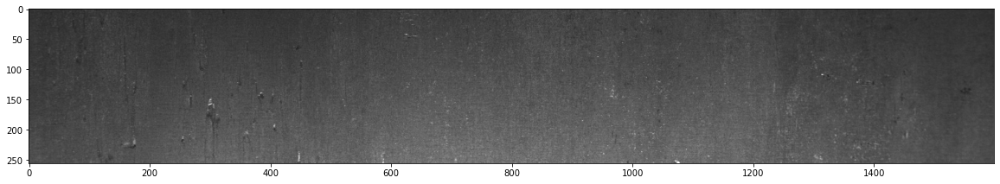

<AxesSubplot:>

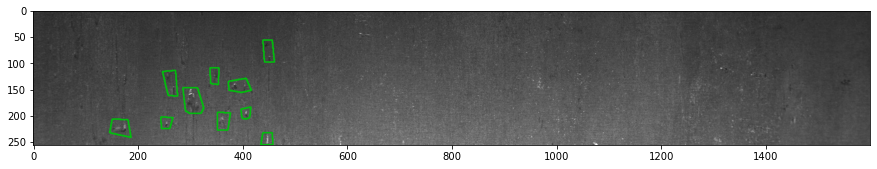

In [43]:
#Пример изображения с дефектом класса 1
filename='000a4bcdd.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
show_masked_image(filename)

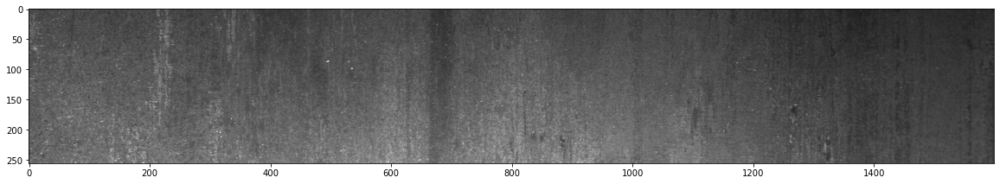

<AxesSubplot:>

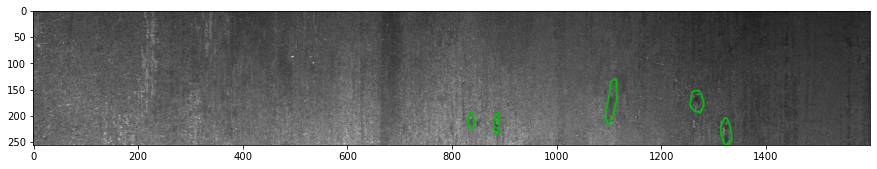

In [44]:
filename='00bc01bfe.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

In [45]:
#Первые 10 изображений с дефектами класса 2
train_data[train_data['Defect_2']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
14,002fc4e19.jpg,146021 3 146275 10 146529 40 146783 46 147038 ...,145658 7 145901 20 146144 33 146386 47 146629 ...,,,1,2
34,008ef3d74.jpg,356336 4 356587 11 356838 18 357089 25 357340 ...,375439 5 375687 14 375935 24 376182 34 376430 ...,,,1,2
37,00ac8372f.jpg,101742 3 101998 12 102253 19 102301 22 102509 ...,98114 24 98370 72 98626 119 98881 168 99137 19...,,,1,2
44,00c88fed0.jpg,10474 7 10728 15 10983 18 11239 21 11494 24 11...,13428 8 13684 24 13940 39 14196 55 14452 71 14...,,,1,2
116,026183d85.jpg,,120132 16 120388 46 120643 78 120899 108 12115...,,,1,1
191,0405e7c54.jpg,,9993 62 10249 186 10505 248 10761 248 11017 24...,,,1,1
255,05747b10b.jpg,,241477 13 241733 38 241988 64 242244 89 242500...,,,1,1
279,060964105.jpg,,124675 21 124931 61 125187 102 125443 142 1256...,,,1,1
280,060c3159e.jpg,,235749 28 235950 83 236151 138 236379 166 2366...,,,1,1
295,068c6c4a9.jpg,,379683 147 379939 147 380194 148 380450 148 38...,,,1,1


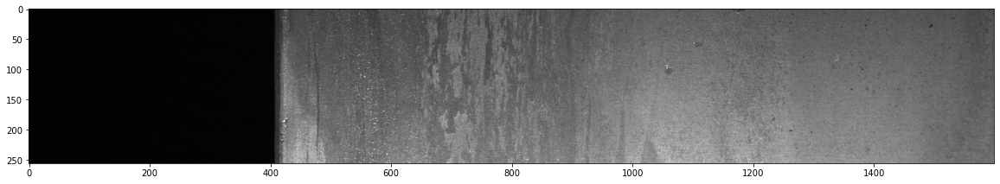

<AxesSubplot:>

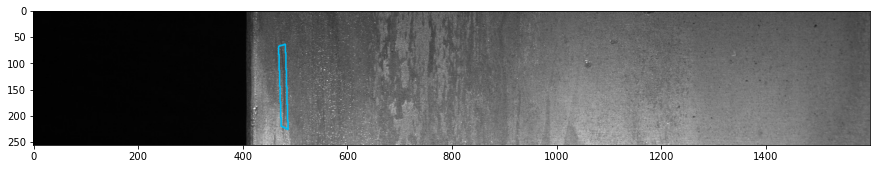

In [46]:
#Пример изображения с дефектом класса 2
filename='026183d85.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

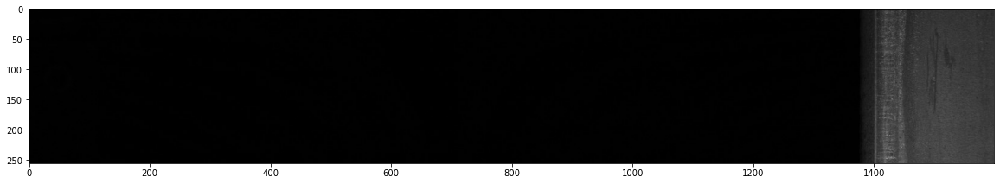

<AxesSubplot:>

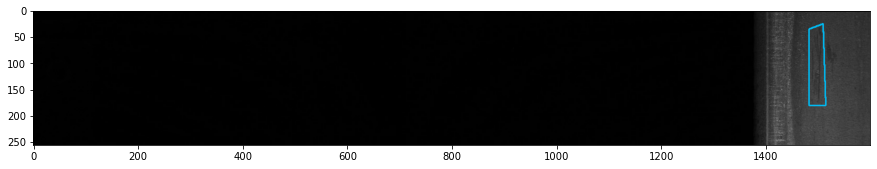

In [47]:
filename='068c6c4a9.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

In [48]:
#Первые 10 изображений с дефектами класса 3
train_data[train_data['Defect_3']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
4,0007a71bf.jpg,,,18661 28 18863 82 19091 110 19347 110 19603 11...,,1,1
7,0014fce06.jpg,,,229501 11 229741 33 229981 55 230221 77 230468...,,1,1
11,0025bde0c.jpg,,,8458 14 8707 35 8963 48 9219 71 9475 88 9731 8...,315139 8 315395 15 315651 16 315906 17 316162 ...,1,2
17,0046839bd.jpg,,,152926 1 153180 4 153434 6 153689 8 153943 11 ...,,1,1
19,005d86c25.jpg,,,331 18 587 53 843 89 1099 124 1355 159 1611 17...,,1,1
22,005f02e20.jpg,,,318652 8 318863 6 318903 17 319114 15 319158 2...,,1,1
23,005f19695.jpg,,,123137 7 123393 19 123649 32 123905 44 124161 ...,,1,1
30,0088260da.jpg,,,26044 13 26283 40 26522 67 26762 92 27001 119 ...,,1,1
33,008d0f87b.jpg,,,72425 21 72641 61 72856 102 73071 142 73287 18...,,1,1
35,0095cd374.jpg,,,10674 18 10926 48 11178 52 11430 56 11682 60 1...,,1,1


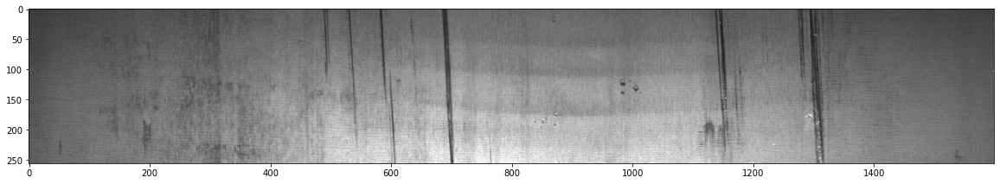

<AxesSubplot:>

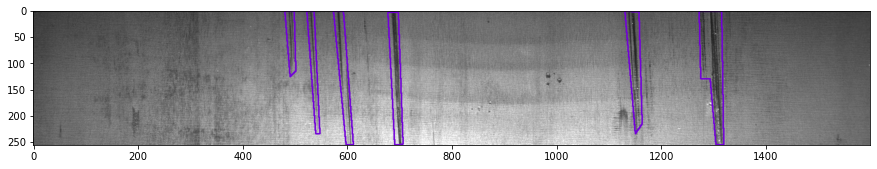

In [49]:
#Пример изображения с дефектом класса 3
filename='005f19695.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

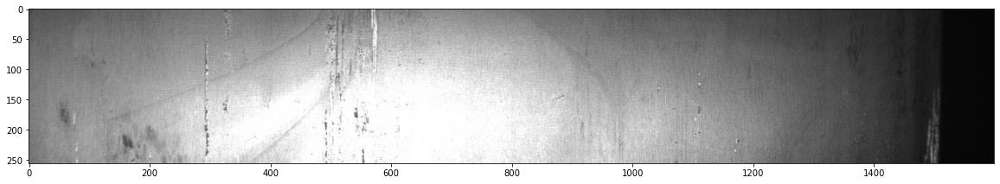

<AxesSubplot:>

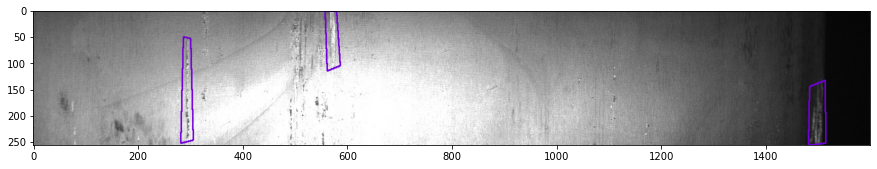

In [50]:
filename='008d0f87b.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

In [51]:
#Первые 10 изображений с дефектами класса 4
train_data[train_data['Defect_4']!=''].head(10)

,ImageId,Defect_1,Defect_2,Defect_3,Defect_4,has_defect,number_of_defects
6,000f6bf48.jpg,,,,131973 1 132228 4 132483 6 132738 8 132993 11 ...,1,1
11,0025bde0c.jpg,,,8458 14 8707 35 8963 48 9219 71 9475 88 9731 8...,315139 8 315395 15 315651 16 315906 17 316162 ...,1,2
12,002af848d.jpg,,,,290800 6 291055 13 291311 15 291566 18 291822 ...,1,1
15,0030401a5.jpg,,,,186833 1 187089 3 187344 6 187600 7 187855 10 ...,1,1
29,008621629.jpg,,,,215548 3 215798 9 216051 12 216306 13 216560 1...,1,1
64,012f26693.jpg,,,4396 14 4632 42 4878 61 5133 70 5388 76 5643 7...,35258 2 35513 5 35768 8 36023 11 36277 15 3653...,1,2
76,016efe618.jpg,,,,241 13 473 37 704 62 936 86 1179 100 1434 101 ...,1,1
81,018ccdfed.jpg,,,,195606 1 195860 4 196113 9 196366 13 196620 16...,1,1
86,01afbfa7a.jpg,,,,271962 1 272217 4 272473 6 272728 8 272983 11 ...,1,1
93,01cfacf80.jpg,,,299116 11 299350 33 299521 6 299582 57 299777 ...,10 82 139 18 265 149 521 150 776 152 1032 152 ...,1,2


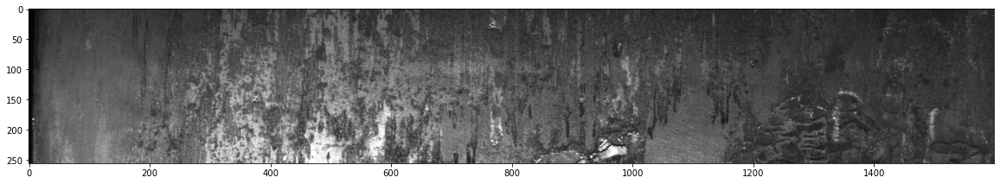

<AxesSubplot:>

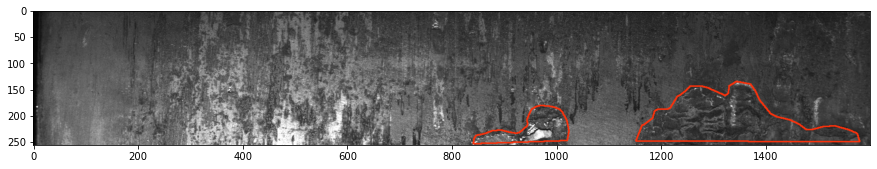

In [52]:
#Пример изображения с дефектом класса 4
filename='008621629.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

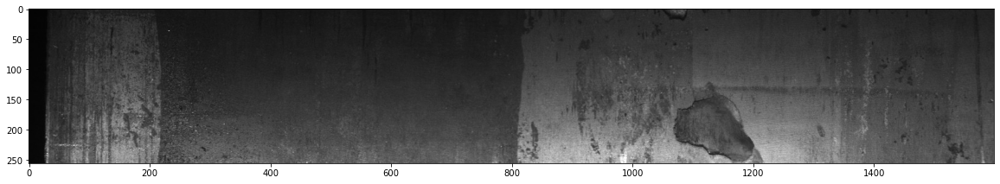

<AxesSubplot:>

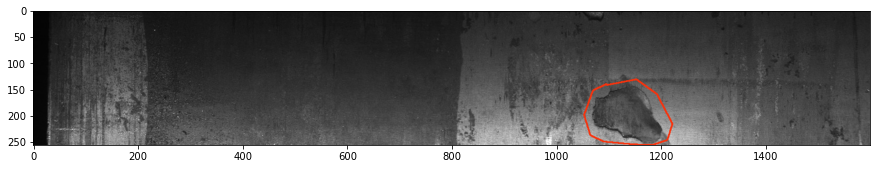

In [53]:
filename='038f14456.jpg'
img_dir='train_images'
img = imageio.imread(os.path.join(os.path.join(data_dir,img_dir), filename)) #Read the image from the desktop
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.show()
plt.show()
show_masked_image(filename)

### Размер mask для классов дефектов

Так как у нас бинарные masks (1 или 0), то мы можем посчитать число пикселей с дефектом (где 1) в маске, чтобы как-то оценить размер дефектов каждого класса и посмотреть как это зависит от класса дефекта. 

In [54]:
# Посчитаем сумму пикселей с 1 в маске для каждого класса (class id)
df_train['ClassId_str'] = df_train['ClassId'].astype(str)

df_train['mask_pixel_sum'] = df_train.apply(lambda x: rle_to_mask(x['EncodedPixels']).sum(), axis=1)

class_ids = [str(i) for i in range(1, 5)]
mask_count_per_class = [df_train[(df_train['ClassId_str']==class_id)&(df_train['mask_pixel_sum']!=0)]['mask_pixel_sum'].count() for class_id in class_ids]
pixel_sum_per_class = [df_train[(df_train['ClassId_str']==class_id)&(df_train['mask_pixel_sum']!=0)]['mask_pixel_sum'].sum() for class_id in class_ids]

In [55]:
mask_count_per_class

[897, 247, 5150, 801]

In [56]:
pixel_sum_per_class

[3912129, 834471, 131306899, 27533572]

In [57]:
df_train

,ImageId,ClassId,EncodedPixels,ClassId_str,mask_pixel_sum
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...,1,4396
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...,3,6897
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...,1,8319
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...,4,69357
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...,3,4851
...,...,...,...,...,...
7090,ffcf72ecf.jpg,3,121911 34 122167 101 122422 169 122678 203 122...,3,8903
7091,fff02e9c5.jpg,3,207523 3 207777 9 208030 15 208283 22 208537 2...,3,7206
7092,fffe98443.jpg,3,105929 5 106177 14 106424 24 106672 33 106923 ...,3,2336
7093,ffff4eaa8.jpg,3,16899 7 17155 20 17411 34 17667 47 17923 60 18...,3,23503


In [58]:
# Построим pie chart (справа - число изображений, содержащих дефекты данного класса)
# Слева - Суммарное число пикселей, содержащих дефекты данного класса
fig = plotly.subplots.make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=class_ids, values=mask_count_per_class, name="Mask Count"), 1, 1)
fig.add_trace(go.Pie(labels=class_ids, values=pixel_sum_per_class, name="Pixel Count"), 1, 2)
# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Steel Defect Mask & Pixel Count",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Count', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Sum', x=0.80, y=0.5, font_size=20, showarrow=False)])
fig['layout'].update(height=400, width=900, title='Pixel count and sum per class mask', legend={'traceorder':'normal'})
fig.show()

In [59]:
# Построим гистограмму и box plot
fig = px.histogram(df_train[df_train['mask_pixel_sum']!=0][['ClassId','mask_pixel_sum']], 
                   x="mask_pixel_sum", y="ClassId", color="ClassId", marginal="box")

fig['layout'].update(height=400, width=900,title='Histogram and Boxplot of Sum of Mask Pixels Per Class')
fig.show()

Из гистограммы и box plot можно подтвердить, что дефекты класса 4 обычно больше по размеру, чем дефекты класса 3, и очевидно дефекты классов 1 и 2. Дефекты класса 3 содержат больше outliers. </br>

Несмотря на то, что дефекты класса 4 обычно больше по размеру, чем дефекты класса 3, outliers класса 3 могут значительно превышать по размеру дефекты класса 4. 

## Modelling

In [60]:
import tensorflow as tf
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split

In [61]:
# network configuration parameters
# original image is 1600x256, so we will resize it
img_w = 512 # resized weidth
img_h = 128 # resized height
batch_size = 8
epochs = 20
# batch size for training unet
val_size = .20 # split of training set between train and validation set
# we will repeat the images with lower samples to make the training process more fair
repeat = False
# only valid if repeat is True
class_1_repeat = 1 # repeat class 1 examples x times
class_2_repeat = 1
class_3_repeat = 1
class_4_repeat = 1

### Data generator 

In [62]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, list_ids, labels, image_dir, batch_size=32,
                 img_h=256, img_w=512, shuffle=True):
        
        self.list_ids = list_ids
        self.labels = labels
        self.image_dir = image_dir
        self.batch_size = batch_size
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()
    
    def __len__(self):
        'denotes the number of batches per epoch'
        return int(np.floor(len(self.list_ids)) / self.batch_size)
    
    def __getitem__(self, index):
        'generate one batch of data'
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        # get list of IDs
        list_ids_temp = [self.list_ids[k] for k in indexes]
        # generate data
        X, y = self.__data_generation(list_ids_temp)
        # return data 
        return X, y
    
    def on_epoch_end(self):
        'update ended after each epoch'
        self.indexes = np.arange(len(self.list_ids))
        if self.shuffle:
            np.random.shuffle(self.indexes)
            
    def __data_generation(self, list_ids_temp):
        'generate data containing batch_size samples'
        X = np.empty((self.batch_size, self.img_h, self.img_w, 1))
        y = np.empty((self.batch_size, self.img_h, self.img_w, 4))
        
        for idx, id in enumerate(list_ids_temp):
            file_path =  os.path.join(os.path.join(data_dir,img_dir), filename)
            image = cv2.imread(file_path, 0)
            image_resized = cv2.resize(image, (self.img_w, self.img_h))
            image_resized = np.array(image_resized, dtype=np.float64)
            # standardization of the image
#             image_resized -= image_resized.mean()
#             image_resized /= image_resized.std()
            image_resized = image_resized.astype('float') / 255.
            mask = np.empty((img_h, img_w, 4))
            
            for idm, image_class in enumerate(['1','2','3','4']):
                rle = self.labels.get(id + '_' + image_class)
                # if there is no mask create empty mask
                if rle is None:
                    class_mask = np.zeros((1600, 256))
                else:
                    class_mask = rle_to_mask(rle, (1600, 256))
             
                class_mask_resized = cv2.resize(class_mask, (self.img_w, self.img_h))
                mask[..., idm] = class_mask_resized
            
            X[idx,] = np.expand_dims(image_resized, axis=2)
            y[idx,] = mask
        
        # normalize Y
        #y = (y > 0).astype(int)
        y = (y > 0).astype(np.float32)
        X=X.astype(np.float32)
            
        return X, y

In [63]:
# create a dict of all the masks
masks = {}
for index, row in train_d.iterrows():
    masks[str(row['ImageId'])+'_'+str(row['ClassId'])] = row['EncodedPixels']

In [64]:
# repeat low represented samples more frequently to balance our dataset
if repeat:
    class_1_img_id = train_d[(train_d['EncodedPixels']!=-1) & (train_d['ClassId']=='1')]['ImageId'].values
    class_1_img_id = np.repeat(class_1_img_id, class_1_repeat)
    class_2_img_id = train_d[(train_d['EncodedPixels']!=-1) & (train_f['ClassId']=='2')]['ImageId'].values
    class_2_img_id = np.repeat(class_2_img_id, class_2_repeat)
    class_3_img_id = train_d[(train_d['EncodedPixels']!=-1) & (train_d['ClassId']=='3')]['ImageId'].values
    class_3_img_id = np.repeat(class_3_img_id, class_3_repeat)
    class_4_img_id = train_d[(train_d['EncodedPixels']!=-1) & (train_d['ClassId']=='4')]['ImageId'].values
    class_4_img_id = np.repeat(class_4_img_id, class_4_repeat)
    train_image_ids = np.concatenate([class_1_img_id, class_2_img_id, class_3_img_id, class_4_img_id])
else:
    # split the training data into train and validation set (stratified)
    train_image_ids = train_d['ImageId'].unique()

In [65]:
X_train, X_val = train_test_split(train_image_ids, test_size=val_size, random_state=42)

In [66]:
params = {'img_h': img_h,
          'img_w': img_w,
          'image_dir': 'train_images',
          'batch_size': batch_size,
          'shuffle': True}

# Get Generators
training_generator = DataGenerator(X_train, masks, **params)
validation_generator = DataGenerator(X_val, masks, **params)

In [67]:
# check out the shapes
#x - картинка
#y - соответствующие картинке 4 маски (для каждого класса дефектов)
x, y = training_generator.__getitem__(1)
print(x.shape, y.shape)

(8, 128, 512, 1) (8, 128, 512, 4)


In [68]:
masks

{'0002cc93b.jpg_1': '29102 12 29346 24 29602 24 29858 24 30114 24 30370 24 30626 24 30882 24 31139 23 31395 23 31651 23 31907 23 32163 23 32419 23 32675 23 77918 27 78174 55 78429 60 78685 64 78941 68 79197 72 79452 77 79708 81 79964 85 80220 89 80475 94 80731 98 80987 102 81242 105 81498 105 81754 104 82010 104 82265 105 82521 31 82556 69 82779 27 82818 63 83038 22 83080 57 83297 17 83342 50 83555 13 83604 44 83814 8 83866 37 84073 3 84128 31 84390 25 84652 18 84918 8 85239 10 85476 29 85714 47 85960 57 86216 57 86471 58 86727 58 86983 58 87238 59 87494 59 87750 59 88005 60 88261 60 88517 60 88772 61 89028 53 89283 40 89539 32 89667 10 89795 30 89923 28 90050 29 90179 37 90306 27 90434 38 90562 14 90690 38 90817 9 90946 38 91073 3 91202 38 91458 38 91714 38 91969 39 92225 39 92481 39 92737 39 92993 39 93248 40 93504 40 93760 40 94026 30 94302 10 189792 7 190034 21 190283 28 190539 28 190795 28 191051 28 191307 28 191563 28 191819 28 192075 28 192331 28 192587 28 192843 23 193099 14 19

In [69]:
#Number of butches per epoch for training
training_generator.__len__()

1038

In [70]:
#Number of batches per epoch for validation
validation_generator.__len__()

259

In [71]:
# visualize steel image with four classes of faults in seperate columns
def viz_steel_img_mask(img, masks):
    img = cv2.cvtColor(img.astype('float32'), cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(nrows=1, ncols=4, sharey=True, figsize=(20,10))
    cmaps = ["Oranges", "Blues", "Purples", "Reds"]
    for idx, mask in enumerate(masks):
        ax[idx].imshow(img)
        ax[idx].imshow(mask, alpha=0.3, cmap=cmaps[idx])

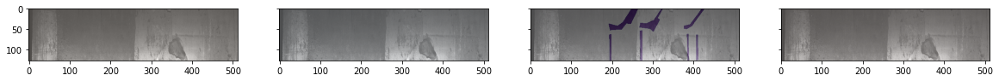

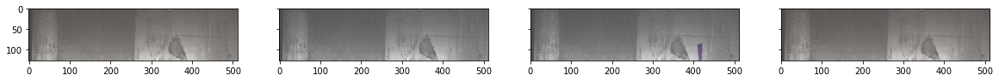

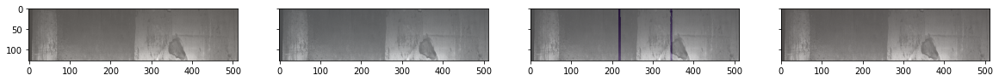

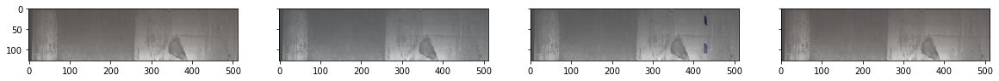

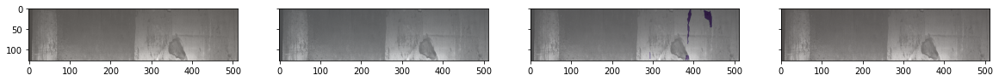

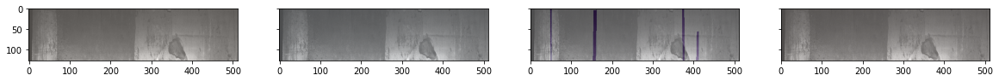

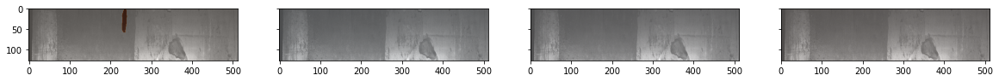

In [72]:
# lets visualize some images with their faults to make sure our data generator is working like it should
x, y = training_generator[np.random.randint(len(training_generator))]
for ix in range(0,batch_size):
    if y[ix].sum() > 0:
        img = x[ix]
        masks_temp = [y[ix][...,i] for i in range(0,4)]
        viz_steel_img_mask(img, masks_temp)

### Построение модели 

In [74]:
#Source:
# https://github.com/fchollet/deep-learning-models/blob/master/resnet50.py


pretrained_url = (
    "https://github.com/fchollet/deep-learning-models/"
    "releases/download/v0.2/"
    "resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5"
)


def one_side_pad(x):
    x = ZeroPadding2D((1, 1))(x)
    x = Lambda(lambda x: x[:, :-1, :-1, :])(x)
    return x


def identity_block(input_tensor, kernel_size, filters, stage, block):
    """The identity block is the block that has no conv layer at shortcut.
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at
                     main path
        filters: list of integers, the filterss of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    # Returns
        Output tensor for the block.
    """
    filters1, filters2, filters3 = filters

    conv_name_base = "res" + str(stage) + block + "_branch"
    bn_name_base = "bn" + str(stage) + block + "_branch"

    x = Conv2D(filters1, (1, 1), name=conv_name_base + "2a")(input_tensor)
    x = BatchNormalization(name=bn_name_base + "2a")(x)
    x = Activation("relu")(x)

    x = Conv2D(filters2, kernel_size, padding="same", name=conv_name_base + "2b")(x)
    x = BatchNormalization(name=bn_name_base + "2b")(x)
    x = Activation("relu")(x)

    x = Conv2D(filters3, (1, 1), name=conv_name_base + "2c")(x)
    x = BatchNormalization(name=bn_name_base + "2c")(x)

    x = layers.add([x, input_tensor])
    x = Activation("relu")(x)
    return x


def conv_block(input_tensor, kernel_size, filters, stage, block, strides=(2, 2)):
    """conv_block is the block that has a conv layer at shortcut
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at
                     main path
        filters: list of integers, the filterss of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    # Returns
        Output tensor for the block.
    Note that from stage 3, the first conv layer at main path is with
    strides=(2,2) and the shortcut should have strides=(2,2) as well
    """
    filters1, filters2, filters3 = filters

    conv_name_base = "res" + str(stage) + block + "_branch"
    bn_name_base = "bn" + str(stage) + block + "_branch"

    x = Conv2D(filters1, (1, 1), strides=strides, name=conv_name_base + "2a")(
        input_tensor
    )
    x = BatchNormalization(name=bn_name_base + "2a")(x)
    x = Activation("relu")(x)

    x = Conv2D(filters2, kernel_size, padding="same", name=conv_name_base + "2b")(x)
    x = BatchNormalization(name=bn_name_base + "2b")(x)
    x = Activation("relu")(x)

    x = Conv2D(filters3, (1, 1), name=conv_name_base + "2c")(x)
    x = BatchNormalization(name=bn_name_base + "2c")(x)

    shortcut = Conv2D(filters3, (1, 1), strides=strides, name=conv_name_base + "1")(
        input_tensor
    )
    shortcut = BatchNormalization(name=bn_name_base + "1")(shortcut)

    x = layers.add([x, shortcut])
    x = Activation("relu")(x)
    return x


def resnet50_encoder(input_shape, weights="imagenet"):
    assert input_shape[0] % 32 == 0
    assert input_shape[1] % 32 == 0

    img_input = Input(shape=input_shape)

    x = ZeroPadding2D((3, 3))(img_input)
    x = Conv2D(64, (7, 7), strides=(1, 1), name="conv1")(x)
    f1 = x

    x = BatchNormalization(name="bn_conv1")(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((3, 3), strides=(2, 2))(x)

    x = conv_block(x, 3, [64, 64, 256], stage=2, block="a", strides=(1, 1))
    x = identity_block(x, 3, [64, 64, 256], stage=2, block="b")
    x = identity_block(x, 3, [64, 64, 256], stage=2, block="c")
    f2 = one_side_pad(x)

    x = conv_block(x, 3, [128, 128, 512], stage=3, block="a")
    x = identity_block(x, 3, [128, 128, 512], stage=3, block="b")
    x = identity_block(x, 3, [128, 128, 512], stage=3, block="c")
    x = identity_block(x, 3, [128, 128, 512], stage=3, block="d")
    f3 = x

    x = conv_block(x, 3, [256, 256, 1024], stage=4, block="a")
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block="b")
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block="c")
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block="d")
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block="e")
    x = identity_block(x, 3, [256, 256, 1024], stage=4, block="f")
    f4 = x

    x = conv_block(x, 3, [512, 512, 2048], stage=5, block="a")
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block="b")
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block="c")
    f5 = x

    x = AveragePooling2D((7, 7), name="avg_pool")(x)
    # f6 = x

    if weights == "imagenet":
        weights_path = keras.utils.get_file(
            pretrained_url.split("/")[-1], pretrained_url
        )
        Model(img_input, x).load_weights(weights_path)

    return img_input, [f1, f2, f3, f4, f5]


def unet(input_shape, n_classes, encoder, l1_skip_conn=True, weights='imagenet', output_act_f='softmax'):

    img_input, levels = encoder(input_shape=input_shape, weights=weights)
    [f1, f2, f3, f4, f5] = levels
    

#     x = f5
#     x = ZeroPadding2D((1, 1))(x)
#     x = Conv2D(512, (3, 3), padding="valid", activation="relu")(x)
#     x = BatchNormalization()(x)
#     x = UpSampling2D((2, 2))(x)
#     x = Concatenate(axis=-1)([x, f4])
    
    x = f4
    x = ZeroPadding2D((1, 1))(x)
    x = Conv2D(512, (3, 3), padding="valid", activation="relu")(x)
    x = BatchNormalization()(x)
    x = UpSampling2D((2, 2))(x)
    x = Concatenate(axis=-1)([x, f3])
    
    x = ZeroPadding2D((1, 1))(x)
    x = Conv2D(256, (3, 3), padding="valid", activation="relu")(x)
    x = BatchNormalization()(x)
    x = UpSampling2D((2, 2))(x)
    x = Concatenate(axis=-1)([x, f2])
    
    x = ZeroPadding2D((1, 1))(x)
    x = Conv2D(128, (3, 3), padding="valid", activation="relu")(x)
    x = BatchNormalization()(x)
    x = UpSampling2D((2, 2))(x)
    x = Concatenate(axis=-1)([x, f1])

    x = ZeroPadding2D((1, 1))(x)
    x = Conv2D(64, (3, 3), padding="valid", activation="relu")(x)
    x = BatchNormalization()(x)

    x = Conv2D(n_classes, (3, 3), padding="same", activation=output_act_f)(x)

    model = Model(inputs=img_input, outputs=x)

    return model

### Loss and Performance Metric

In [73]:
# Dice similarity coefficient loss, brought to you by: https://github.com/nabsabraham/focal-tversky-unet
def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = Flatten()(y_true)
    y_pred_f = Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    loss = binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)
    return loss

# Focal Tversky loss, brought to you by:  https://github.com/nabsabraham/focal-tversky-unet
def tversky(y_true, y_pred, smooth=1e-6):
    y_true_pos = tf.keras.layers.Flatten()(y_true)
    y_pred_pos = tf.keras.layers.Flatten()(y_pred)
    true_pos = tf.reduce_sum(y_true_pos * y_pred_pos)
    false_neg = tf.reduce_sum(y_true_pos * (1-y_pred_pos))
    false_pos = tf.reduce_sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true, y_pred)

def focal_tversky_loss(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return tf.keras.backend.pow((1-pt_1), gamma)

In [75]:
save_model = True


# Kernel Configurations
make_submission = False # used to turn off lengthy model analysis so a submission version doesn't run into memory error
load_pretrained_model = False # load a pre-trained model

In [76]:
model = unet(input_shape=(img_h, img_w, 1), encoder=resnet50_encoder, n_classes=4, weights=None, output_act_f='sigmoid')


from tensorflow.keras.metrics import binary_accuracy
from tensorflow.keras.optimizers import SGD, Adam, Nadam

model.compile(optimizer = 'adam', loss=dice_loss, metrics=['accuracy', dsc, tversky])

In [77]:
model.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 512, 1) 0                                            
__________________________________________________________________________________________________
zero_padding2d_34 (ZeroPadding2 (None, 134, 518, 1)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 128, 512, 64) 3200        zero_padding2d_34[0][0]          
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 128, 512, 64) 256         conv1[0][0]                      
_______________________________________________________________________________________

In [85]:
if load_pretrained_model:
    try:
        model.load_weights(pretrained_model_path)
        print('pre-trained model loaded!')
    except OSError:
        print('You need to run the model and load the trained model')

### Training 

In [79]:
from tensorflow.keras.callbacks import ModelCheckpoint

best_w = ModelCheckpoint('best.h5',
                                monitor='val_dsc',
                                verbose=0,
                                save_best_only=True,
                                save_weights_only=True,
                                mode='auto',
                                period=1)

last_w = ModelCheckpoint('last.h5',
                                monitor='val_dsc',
                                verbose=0,
                                save_best_only=False,
                                mode='auto',
                                period=1)

callbacks = [best_w, last_w]


In [ ]:
history = model.fit_generator(
    generator=training_generator,
    validation_data=validation_generator,
    callbacks=callbacks,
    epochs=epochs,
    verbose=1)

In [6]:
!pip install segmentation_models

In [7]:
%env SM_FRAMEWORK=tf.keras
from segmentation_models import Unet

Segmentation Models: using `tf.keras` framework.


In [94]:
model1 = Unet(classes=4, activation='softmax')

In [95]:
model1.compile(optimizer = 'adam', loss=dice_loss, metrics=['accuracy', dsc, tversky])

In [96]:
model1.summary()

Model: "functional_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 6 1792        input_3[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, None, None, 6 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, None, None, 6 0           block1_conv2[0][0]               
______________________________________________________________________________________

In [97]:
history = model1.fit_generator(
    generator=training_generator,
    validation_data=validation_generator,
    callbacks=callbacks,
    epochs=epochs,
    verbose=1)

Epoch 1/20


InvalidArgumentError:  input depth must be evenly divisible by filter depth: 1 vs 3
	 [[node functional_13/block1_conv1/Relu (defined at <ipython-input-97-10e0c4c89f7d>:1) ]] [Op:__inference_train_function_41807]

Function call stack:
train_function


In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots


def visualize_training_process(history):
    """ 
    Visualize loss and accuracy from training history
    
    :param history: A Keras History object
    """
    history_df = pd.DataFrame(history.history)
    epochs = np.arange(1, len(history_df) + 1)
    fig = make_subplots(3, 1)
    fig.append_trace(go.Scatter(x=epochs, y=history_df['tversky'], mode='lines+markers', name='Tversky'), row=1, col=1)
    fig.append_trace(go.Scatter(x=epochs, y=history_df['val_tversky'], mode='lines+markers', name='Val Tversky'), row=1, col=1)
    
    fig.append_trace(go.Scatter(x=epochs, y=history_df['dsc'], mode='lines+markers', name='Dice'), row=2, col=1)
    fig.append_trace(go.Scatter(x=epochs, y=history_df['val_dsc'], mode='lines+markers', name='Val Dice'), row=2, col=1)
    
    
    
    fig.append_trace(go.Scatter(x=epochs, y=history_df['loss'], mode='lines+markers', name='Loss Train'), row=3, col=1)
    fig.append_trace(go.Scatter(x=epochs, y=history_df['val_loss'], mode='lines+markers', name='Loss Val'), row=3, col=1)
    
    fig.update_layout( xaxis_title="Epochs", template="plotly_white", height=1000)
    
    return fig
visualize_training_process(history)

In [ ]:
# a function to plot image with mask and image with predicted mask next to each other
def viz_single_fault(img, mask, pred, image_class):
    
    fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,5))
    
    cmaps = ["Reds", "Blues", "Greens", "Purples"]
    
    ax[0].imshow(img)
    ax[0].imshow(mask, alpha=0.3, cmap=cmaps[image_class-1])
    ax[0].set_title('Mask - Defect Class %s' % image_class)
    
    ax[1].imshow(img)
    ax[1].imshow(pred, alpha=0.3, cmap=cmaps[image_class-1])
    ax[1].set_title('Predicted Mask - Defect Class %s' % image_class)
    
    plt.show()

In [ ]:
# https://www.jeremyjordan.me/evaluating-image-segmentation-models/
def calculate_iou(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    if np.sum(union) == 0:
        iou_score = 0
    else:
        iou_score = np.sum(intersection) / np.sum(union)
    return iou_score